# Tracking with Min-Cost Flow

The code here is inspired by [DFL 2nd Place Solution](https://www.kaggle.com/competitions/dfl-bundesliga-data-shootout/discussion/360097) by K_MAT.

In [1]:
%load_ext autoreload
%autoreload 2

### Preparing the detection model 

Although the original paper uses the Faster Region CNN (FrRCNN) detection framework for object detection, we will use fine-tuned YOLOv5 models trained on the soccertrack drone dataset as it is faster and more accurate. The model checkpoints can be downloaded from [here](). Place them in the `models` folder and use the following code to load them.

YOLOv5 🚀 v6.2-239-gf33718f Python-3.10.9 torch-1.13.1 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients
Adding AutoShape... 


     bbox_left     bbox_top  bbox_width  bbox_height      conf  class
0  2045.854492  1741.887085   14.060181    13.964600  0.785968    0.0
1   446.697021  1881.433350   13.919312    14.486694  0.038334    0.0


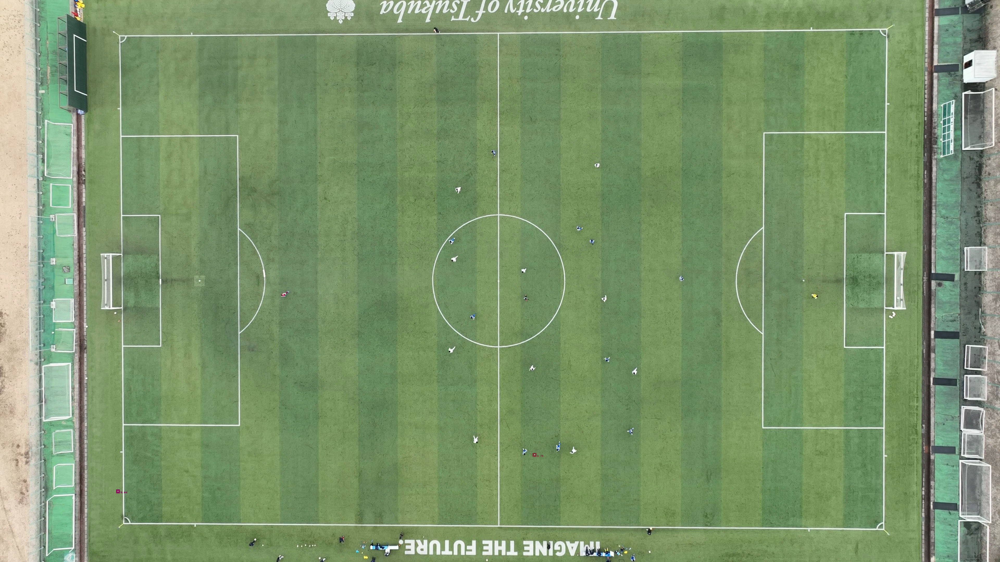

In [2]:
import soccertrack
from soccertrack import detection_model
from soccertrack.utils import get_git_root
from soccertrack import Camera

root = get_git_root()

dataset_path = soccertrack.datasets.get_path('top_view')
path_to_csv = sorted(dataset_path.glob('annotations/*.csv'))[-1]
path_to_mp4 = sorted(dataset_path.glob('videos/*.mp4'))[-1]

bbdf = soccertrack.load_df(path_to_csv) # We will use this as ground truth
cam = Camera(path_to_mp4) # Camera object will be used to load frames
frame = cam[50]

model_name = "yolov5"
model_repo =  root / "external" / "yolov5"
model_ckpt = root / "models" / "yolov5" / "yolov5s_ball_last_1920.pt"

det_model = detection_model.load(model_name, model_repo, model_ckpt)

det_model.model.conf = 0.01
det_model.model.max_det=10

det_result = det_model(frame, size = 1080)

print(det_result.to_df())
det_result.show(width=5)

In [3]:
from soccertrack.metrics.object_detection import ap_score
gt = bbdf.to_list_of_tuples_format({"TeamID": {"BALL": "ball"}, "PlayerID":{}})
gt = gt[gt[:, -3] == "ball"][:, :-1]

gt[:, -1] = gt[:, -1].astype(str)

ap_score(gt, gt, 0.5)['AP']

1.0

## Perform detection on all frames

In [4]:
from soccertrack.logger import tqdm

results = []
cam._seek(0) # TODO: this is a hack, should be fixed in the Camera class
for i, frame in enumerate(tqdm(cam)):
    im = frame
    det_result = det_model(frame, size = 2000)
    results.append(det_result)

100%|██████████| 900/900 [08:51<00:00,  1.69it/s]


In [5]:
# TODO: this should be fixed in the soccertrack library
# This is a hack to get the ground truth in the same format as the predictions

import numpy as np
y_preds = []
y_gts = []
for frame_num, det_result in enumerate(results):
    if len(det_result.pred) != 0:
        df_pred = det_result.to_df()
        df_pred["image_name"] = str(frame_num)
        y_preds += df_pred.values.tolist()

    y_gt = bbdf.get_frame(frame_num).to_list_of_tuples_format({"TeamID": {"BALL": "ball"}, "PlayerID":{}})[:, :7]
    if len(y_gt) > 0:
        y_gts += list(y_gt)

y_preds = np.array(y_preds, dtype=object)
y_gts = np.array(y_gts, dtype=object)

y_preds[:, 5] = 'ball'
y_gts = y_gts[y_gts[:, 5] == "ball"]

In [6]:
print(y_preds[:4])
print(y_gts[:4])

[[1717.16162109375 108.99951934814453 10.9400634765625 9.938446044921875 0.7088722586631775 'ball' '0']
 [449.9795837402344 1881.2650146484375 13.18353271484375 12.581298828125 0.542664647102356 'ball' '0']
 [760.5283203125 1071.2052001953125 12.95013427734375 12.173095703125 0.18674711883068085 'ball' '0']
 [3079.381591796875 1068.93994140625 14.6396484375 13.4447021484375 0.09726940095424652 'ball' '0']]
[[2244.0 1624.0 16.0 16.0 1.0 'ball' 1]
 [2237.0 1626.0 15.0 13.0 1.0 'ball' 2]
 [2230.9 1627.9 15.0 13.0 1.0 'ball' 3]
 [2224.8 1629.8 15.0 13.0 1.0 'ball' 4]]


In [7]:
from soccertrack.metrics.object_detection import map_score

score = map_score(bboxes_det=y_preds, bboxes_gt=y_gts, iou_threshold=0.5)
score

0.02475371845271117

## Draw Detection Results

In [8]:
from soccertrack.utils import make_video
from soccertrack.utils.draw import draw_bounding_boxes
import numpy as np

def draw_func(results, cam, **kwargs):
    
    n_frames = len(cam)
    for i in range(n_frames):
        frame = cam[i]
        bboxes = results[i]
    
        if len(bboxes) <= 0:
            continue
        
        image = draw_bounding_boxes(frame, bboxes, **kwargs)

        yield np.array(image)[:, :, ::-1]

In [9]:
no_mfc_bboxes = []

for frame_num, bboxes in enumerate(results):
    bboxes = bboxes.pred
    if bboxes.shape[0] <= 0:
        bboxes = np.zeros((0, 4))
    else:
        bboxes = bboxes[:, :4]
    no_mfc_bboxes.append(bboxes)

make_video(draw_func(no_mfc_bboxes, cam, colors='red', width=5), "output_without_mcf.mp4", input_framerate=30)

Writing video: 900it [01:00, 14.89it/s]


## Draw Min-Cost-Flow results

In [10]:
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt

def gaussian_prob(x, mean=0, sigma=1):
    return (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def sigmoid(x, L=1, k=1, x0=0):
    return L / (1 + np.exp(-k * (x - x0)))


def find_shortest_path(results=1, L1=1, k1=1, L2=1, k2=1, dist_fill=10, conf_fill=0):
    # create flow graph connecting detections in consecutive frames
    n_frames = len(results) - 1

    G = nx.Graph()
    for frame_id in range(n_frames): # iterate over frames
        # add dummy node for frame
        G.add_node((frame_id, -1))
        
        n_detections = len(results[frame_id])
        for detection_id in range(n_detections): # iterate over detections in frame
            # add node for detection
            G.add_node((frame_id, detection_id))

    # iterate over frames
    for i in range(len(results)-1):
        # select nodes from frame i
        nodes0 = [(i, j) for j in range(len(results[i]))] + [(i, -1)]
        # select nodes from frame i+1
        nodes1 = [(i+1, j) for j in range(len(results[i+1]))] + [(i+1, -1)]

        # connect nodes from frame i to nodes in frame i+1
        # x_frame: frame number
        # x_det_n: detection number
        for (j_frame, j_det) in nodes0:
            for (k_frame, k_det) in nodes1:
                if j_det == -1 or k_det == -1:
                    distance = dist_fill
                    confidence = conf_fill
                else:
                    confidence = results[i][j_det][4]
                    distance = np.linalg.norm(results[i][j_det][:2] - results[i+1][k_det][:2])
                
                cost = sigmoid((1 - confidence), L=L1, k=k1) + sigmoid(distance, L=L2, k=k2)
                G.add_edge((j_frame, j_det), (k_frame, k_det), weight=cost)
    
    # calculate shortest path
    path = nx.shortest_path(G, source=(0, -1), target=(n_frames-2, -1), weight='weight')
    path_length = nx.shortest_path_length(G, source=(0, -1), target=(n_frames-2, -1), weight='weight')
    return path, path_length

# visualize shortest path on top of flow graph with red lines
# pos = {}
# for i in range(len(results)):
#     nodes = [n for n in G.nodes() if n[0] == i]
#     for j, node in enumerate(nodes):
#         pos[node] = (i, j)
#     if i==n_frames+2: break

# fig, ax = plt.subplots(figsize=(10, 10))
# nx.draw(G, pos, node_size=25, ax=ax, node_color='black', edge_color='black', width=0.25, with_labels=True)
# nx.draw_networkx_nodes(G, pos, nodelist=path, node_size=100, node_color='r', ax=ax)
# nx.draw_networkx_edges(G, pos, edgelist=[(path[i], path[i+1]) for i in range(len(path)-1)], edge_color='r', ax=ax)
# ax.set_title("Shortest path")

# plt.show()

In [11]:
from copy import deepcopy
def update_results(results, path):
    results = deepcopy(results)
    updated_results = []
    for i in range(len(results)):
        frame = results[i].copy()
        updated_frame = []
        for j in range(len(frame)):
            detection = frame[j]
            if (i, j) in path:
                updated_frame.append(detection)
        updated_results.append(updated_frame)

    # forward fill in missing detections
    for i in range(len(updated_results)):
        if len(updated_results[i]) == 0 and i > 0:
            updated_results[i] = updated_results[i-1]
            if len(updated_results[i]) > 0:
                updated_results[i][0][:4] = np.nan
            
    # backward fill in missing detections
    for i in range(len(updated_results)-1, -1, -1):
        if len(updated_results[i]) == 0 and i < len(updated_results) - 1:
            updated_results[i] = updated_results[i+1]
            updated_results[i][0][:4] = np.nan
            
    updated_results = np.array(updated_results).squeeze()
    for i in range(len(updated_results)):
        updated_results[i][5] = i

    updated_results = updated_results.astype(object)
    updated_results[:, 5] = updated_results[:, 5].astype(int).astype(str)
    updated_results = np.insert(updated_results, 5, 'ball', axis=1)
    
    bboxes = updated_results[:, :4]
    bboxes = bboxes.astype(float)
    for x in bboxes.T:
        x[np.isnan(x)] = np.interp(np.flatnonzero(np.isnan(x)), np.flatnonzero(~np.isnan(x)), x[~np.isnan(x)])
    updated_results[:, :4] = bboxes
    
    # remove results with nan
    updated_results = updated_results[~np.isnan(updated_results[:, 0].astype(float))]
    # print(updated_results)
    return updated_results


bboxes = [bbox.pred for bbox in results]
path, path_length = find_shortest_path(bboxes)
updated_results = update_results(bboxes, path)
ap_score(updated_results, gt, 0.4)['AP'], path_length

(0.0, 1000.3476169840518)

In [12]:
import optuna

class TqdmCallback:
    def __init__(self, total_trials):
        self.pbar = tqdm(total=total_trials, desc="Optimizing", ncols=80)

    def __call__(self, study, trial):
        best_value = study.best_value
        self.pbar.set_description(f"Best value: {best_value:.4f}")
        self.pbar.update(1)

    def close(self):
        self.pbar.close()


def objective(trial):
    dist_fill = trial.suggest_float('dist_fill', 0, 10000)
    conf_fill = trial.suggest_float('conf_fill', 0, 1)
    
    L1 = trial.suggest_float('L1', 0, 20000)
    k1 = trial.suggest_float('k1', 0, 20000)
    L2 = trial.suggest_float('L2', 0, 20000)
    k2 = trial.suggest_float('k2', 0, 20000)

    try:
        path, path_length = find_shortest_path(bboxes, dist_fill=dist_fill, conf_fill=conf_fill, L1=L1, k1=k1, L2=L2, k2=k2)
        updated_results = update_results(bboxes, path)
        ap = ap_score(updated_results, gt, 0.1)['AP']
    except:
        ap = 0
    
    return ap#, path_length

optuna.logging.set_verbosity(optuna.logging.WARNING)

n_trials = 1000
callback = TqdmCallback(total_trials=n_trials)
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=n_trials, callbacks=[callback])
# Close the progress bar
callback.close()

print("Best trial:")
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

Best value: 0.0555: 100%|███████████████████| 1000/1000 [10:17<00:00,  1.62it/s]

Best trial:
  Value:  0.05545664013405949
  Params: 
    dist_fill: 5088.281645117437
    conf_fill: 0.7988627832706892
    L1: 14865.433441495914
    k1: 19924.00491490283
    L2: 2431.6812295382424
    k2: 9647.395125045612


In [13]:
# Best trial:
#   Value:  0.6156990003417696
#   Params: 
#     dist_fill: 9522.710012275107
#     conf_fill: 0.5538963501926321
#     L1: 12631.771902027638
#     k1: 5.400862662789353
#     L2: 9056.581857493275
#     k2: 13247.17761307754

/var/folders/6m/8_2yd721373cx0m954405yd00000gn/T/ipykernel_7572/2203811637.py:3: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  ax = optuna.visualization.matplotlib.plot_contour(study, params=['k1', 'k2'], target_name='AP')
[W 2023-04-21 03:45:19,488] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


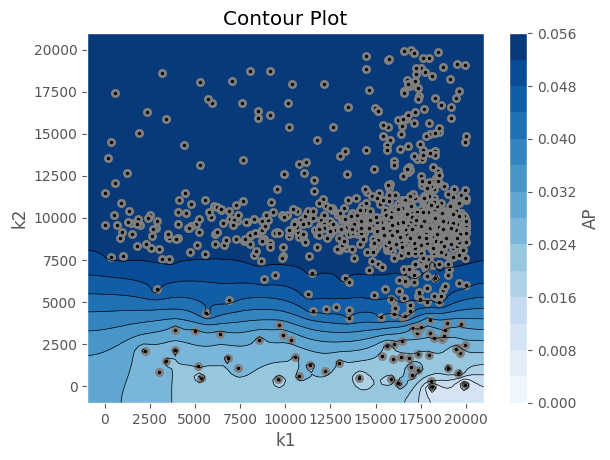

In [14]:
import matplotlib as mpl

ax = optuna.visualization.matplotlib.plot_contour(study, params=['k1', 'k2'], target_name='AP')

/var/folders/6m/8_2yd721373cx0m954405yd00000gn/T/ipykernel_7572/1036994904.py:1: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<AxesSubplot: title={'center': 'Hyperparameter Importances'}, xlabel='Importance for Objective Value', ylabel='Hyperparameter'>

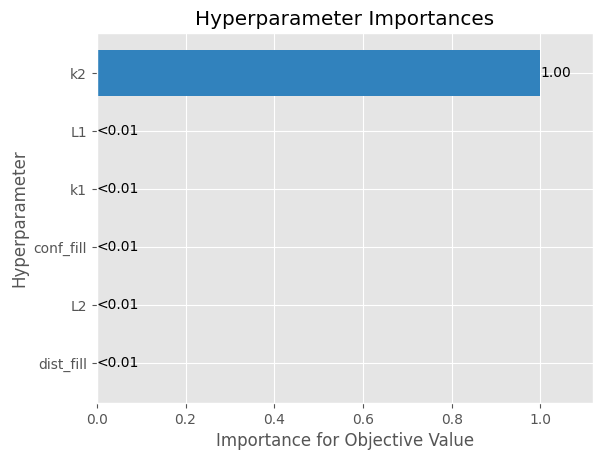

In [15]:
optuna.visualization.matplotlib.plot_param_importances(study)

In [18]:
from soccertrack.utils import make_video
import numpy as np

path, path_length = find_shortest_path(
    bboxes,
    dist_fill=trial.params["dist_fill"],
    conf_fill=trial.params["conf_fill"],
    L1=trial.params["L1"],
    k1=trial.params["k1"],
    L2=trial.params["L2"],
    k2=trial.params["k2"],
)
updated_results = update_results(bboxes, path)

boxes = np.expand_dims(updated_results[:, :4], axis=1)
make_video(
    draw_func(boxes, cam, colors=["red"], width=3),
    "output_with_mcf.mp4",
    input_framerate=30,
)


Writing video: 900it [01:02, 14.46it/s]
